In [8]:
import networkx as nx
import EoN
import matplotlib.pyplot as plt
import matplotlib.animation
import pandas as pd

In [9]:
# calculate average transmission rate
tx_rates = pd.read_csv('rt.csv')
tx_rates = tx_rates.loc[tx_rates['date'] == '2020-11-13']
tx_rates = tx_rates[['date','region', 'mean']]
avg_tx_rate = tx_rates['mean'].mean()

1.16065531177812

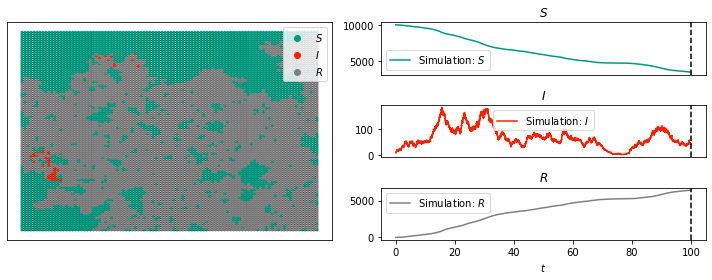

In [10]:
# model of uncontrolled spread

# establish grid of 10000 people
grid = nx.grid_2d_graph(100,100) 

# infect 16 individuals
initial_infections = [(u,v) for (u,v) in grid if 48<u<52 and 48<v<52]

# lowest recovery rate estimate is approximately 97% as of 11/2020
recovery_rate = .97

# simulate for 100 days
time = 100

# create an SIR model and simulate it
sim = EoN.fast_SIR(grid, avg_tx_rate, recovery_rate, initial_infecteds = initial_infections,
               return_full_data=True, tmax = 100)

# plot model
pos = {node:node for node in grid}
sim.set_pos(pos)
sim.display(100, node_size = 4)
plt.savefig('imgs/NoContactTracing.png')

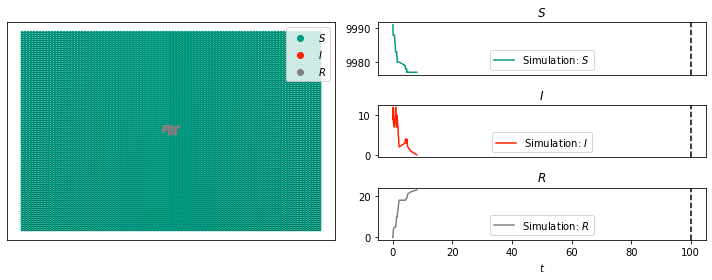

In [11]:
# model of spread with contact tracing

# establish grid of 10000 people
grid = nx.grid_2d_graph(100,100) 

# infect 16 individuals
initial_infections = [(u,v) for (u,v) in grid if 48<u<52 and 48<v<52]

# reduction of transmission rate due to extensive contact tracing is estimated to be up to 64%
contact_tracing_reduction = .64

final_tx_rate = avg_tx_rate - contact_tracing_reduction

# lowest recovery rate estimate is approximately 97% as of 11/2020
recovery_rate = .97

# simulate for 100 days
time = 100

# create an SIR model and simulate it
sim = EoN.fast_SIR(grid, final_tx_rate, recovery_rate, initial_infecteds = initial_infections,
               return_full_data=True, tmax = 100)

# plot model
pos = {node:node for node in grid}
sim.set_pos(pos)
sim.display(100, node_size = 4)
plt.savefig('imgs/FullContactTracing.png')

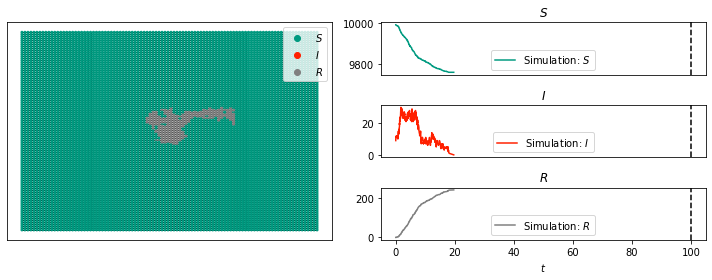

In [12]:
# model of spread with more contact tracing

# establish grid of 10000 people
grid = nx.grid_2d_graph(100,100) 

# infect 16 individuals
initial_infections = [(u,v) for (u,v) in grid if 48<u<52 and 48<v<52]

# reduction of transmission rate with some uptake of contact tracing
contact_tracing_reduction = .30

final_tx_rate = avg_tx_rate - contact_tracing_reduction

# lowest recovery rate estimate is approximately 97% as of 11/2020
recovery_rate = .97

# simulate for 100 days
time = 100

# create an SIR model and simulate it
sim = EoN.fast_SIR(grid, final_tx_rate, recovery_rate, initial_infecteds = initial_infections,
               return_full_data=True, tmax = 100)

# plot model
pos = {node:node for node in grid}
sim.set_pos(pos)
sim.display(100, node_size = 4)
plt.savefig('imgs/MoreContactTracing.png')

In [ ]:
# model of spread with little contact tracing

# establish grid of 10000 people
grid = nx.grid_2d_graph(100,100) 

# infect 16 individuals
initial_infections = [(u,v) for (u,v) in grid if 48<u<52 and 48<v<52]

# reduction of transmission rate with some uptake of contact tracing
contact_tracing_reduction = .10

final_tx_rate = avg_tx_rate - contact_tracing_reduction

# lowest recovery rate estimate is approximately 97% as of 11/2020
recovery_rate = .97

# simulate for 100 days
time = 100

# create an SIR model and simulate it
sim = EoN.fast_SIR(grid, final_tx_rate, recovery_rate, initial_infecteds = initial_infections,
               return_full_data=True, tmax = 100)

# plot model
pos = {node:node for node in grid}
sim.set_pos(pos)
sim.display(100, node_size = 4)
plt.savefig('imgs/LittleContactTracing.png')